In [1]:
import sys
sys.path.append('../mlai_research/')
import log
import utils
import rasterio
import rasterio.plot
from rasterio.mask import mask
from rasterio.enums import Resampling
from rasterio.warp import reproject, Resampling
from rasterio.plot import show
from shapely.geometry import box, mapping
import numpy as np
import matplotlib.pyplot as plt
import os
import geopandas as gpd
import glob

In [2]:
logger = log.get_logger(__name__)

In [3]:
def load_raster(path):
    # Load raster data
    img = rasterio.open(path)
    logger.info(f"Loaded image: {path}")
    logger.info(f"Image channels: {img.count}")
    logger.info(f"Image size: {img.width}x{img.height}")
    logger.info(f"Image crs: {img.crs}")
    logger.info(f"Image bounds: {img.bounds}")
    logger.info(f"Image transform: {img.transform}")
    return img


def sync_crs(gdf, rasterimg) -> bool: 
    if gdf.crs != rasterimg.crs:
        gdf = gdf.set_crs(str(rasterimg.crs))
    return gdf


def load_data(path_raw, path_int_rs, fn_ms, fn_rgb, fn_dsm, fn_dtm, fn_shp):
    imgs = {}
    # 10 bands of Advanced Camera image (multispectral)
    # 3 bands of Normal Camera image
    # 1 band of Digital Surface Model
    # 1 band of Digital Terrain Model
    imgs["ms"] = load_raster(f"{path_int_rs}{fn_ms}")
    imgs["rgb"] = load_raster(f"{path_int_rs}{fn_rgb}")
    imgs["dsm"] = load_raster(f"{path_int_rs}{fn_dsm}")
    imgs["dtm"] = load_raster(f"{path_int_rs}{fn_dtm}")
    # Load shapefile
    gdf = gpd.read_file(f"{path_raw}{fn_shp}")
    return imgs, gdf


def get_bbox(imgs: dict):
    box1 = box(*imgs["ms"].bounds)
    box2 = box(*imgs["rgb"].bounds)
    box3 = box(*imgs["dsm"].bounds)
    box4 = box(*imgs["dtm"].bounds)

    intersect = box1.intersection(box2)
    intersect = intersect.intersection(box3)
    intersect = intersect.intersection(box4)

    return intersect


def clip_raster_to_bounds(name, path_int, raster, target_bounds):
    # Create a polygon from the target bounds
    target_polygon = box(*target_bounds)

    # Clip the raster using the target polygon
    clipped_data, clipped_transform = mask(raster, [target_polygon], crop=True)

    # Update the raster metadata
    clipped_meta = raster.meta.copy()
    clipped_meta.update({
        'transform': clipped_transform,
        'height': clipped_data.shape[1],
        'width': clipped_data.shape[2]
    })

    # Create a new raster dataset with the clipped data and metadata
    with rasterio.open(f"{path_int}{name}.tif", "w", **clipped_meta) as dst:
        dst.write(clipped_data)

    # Return the clipped raster dataset
    clipped_raster = rasterio.open(f"{path_int}{name}.tif")
    logger.info(f"{clipped_raster.transform}")
    return clipped_raster


def align_rasters(name, path_int, src_raster, ref_raster):
    profile = ref_raster.profile.copy()
    aligned_data = []

    for i in range(1, src_raster.count + 1):
        src_data = src_raster.read(i)
        ref_data = np.empty((ref_raster.height, ref_raster.width), dtype=src_data.dtype)
        reproject(
            src_data,
            ref_data,
            src_transform=src_raster.transform,
            src_crs=src_raster.crs,
            dst_transform=ref_raster.transform,
            dst_crs=ref_raster.crs,
            resampling=Resampling.nearest
        )
        aligned_data.append(ref_data)

    profile.update(count=len(aligned_data))

    with rasterio.open(f"{path_int}{name}.tif", "w", **profile) as dst:
        for i, data in enumerate(aligned_data, start=1):
            dst.write(data, i)

    aligned_raster = rasterio.open(f"{path_int}{name}.tif")
    logger.info(f"{aligned_raster.transform}")
    return aligned_raster


def clip_gdf(gdf, bounds):
    clipped_gdf = gdf[
        (gdf.geometry.x > bounds.left) & 
        (gdf.geometry.x < bounds.right) &
        (gdf.geometry.y > bounds.bottom) &
        (gdf.geometry.y < bounds.top)
    ]
    logger.info(f"Original gdf: {gdf.shape}")
    logger.info(f"Clipped gdf: {clipped_gdf.shape}")
    logger.info(f"Species split: {clipped_gdf.Species.value_counts()}")
    return clipped_gdf


def save_plot(fig, filename):
    fig.savefig(filename)

def plot_raster(gdf, rasterimg, show=True):
    fig, ax = plt.subplots(figsize = (20,20))
    gdf.plot(column='Species',
                   categorical=True,
                   legend=True,
                   cmap="Set2",
                   ax=ax,
            aspect=1)
    ax.set_title("Letaba Points Subset")
    for x, y, label in zip(gdf.geometry.x, gdf.geometry.y, gdf.photoID):
        ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")
    if show == True:
        rasterio.plot.show(rasterimg, ax=ax)
        # plt.show()
    return fig

In [4]:
conf = utils.load_config("base")

06-Nov-23 17:13:25 - INFO - Starting 'load_config'.
06-Nov-23 17:13:25 - INFO - Finished 'load_config' in 0.0152 secs.


06-Nov-23 17:13:25 - INFO - Loaded image: ../data/02_intermediate/resampled/ms.tif
06-Nov-23 17:13:25 - INFO - Image channels: 10
06-Nov-23 17:13:25 - INFO - Image size: 5595x5867
06-Nov-23 17:13:25 - INFO - Image crs: EPSG:32736
06-Nov-23 17:13:25 - INFO - Image bounds: BoundingBox(left=362292.84996986337, bottom=7356585.831903748, right=363844.1084798634, top=7358212.504589749)
06-Nov-23 17:13:25 - INFO - Image transform: | 0.28, 0.00, 362292.85|
| 0.00,-0.28, 7358212.50|
| 0.00, 0.00, 1.00|
06-Nov-23 17:13:25 - INFO - Loaded image: ../data/02_intermediate/resampled/rgb.tif
06-Nov-23 17:13:25 - INFO - Image channels: 4
06-Nov-23 17:13:25 - INFO - Image size: 5595x5867
06-Nov-23 17:13:25 - INFO - Image crs: EPSG:32736
06-Nov-23 17:13:25 - INFO - Image bounds: BoundingBox(left=362292.7879142576, bottom=7356585.876963755, right=363844.0464242576, top=7358212.5496497555)
06-Nov-23 17:13:25 - INFO - Image transform: | 0.28, 0.00, 362292.79|
| 0.00,-0.28, 7358212.55|
| 0.00, 0.00, 1.00|
06

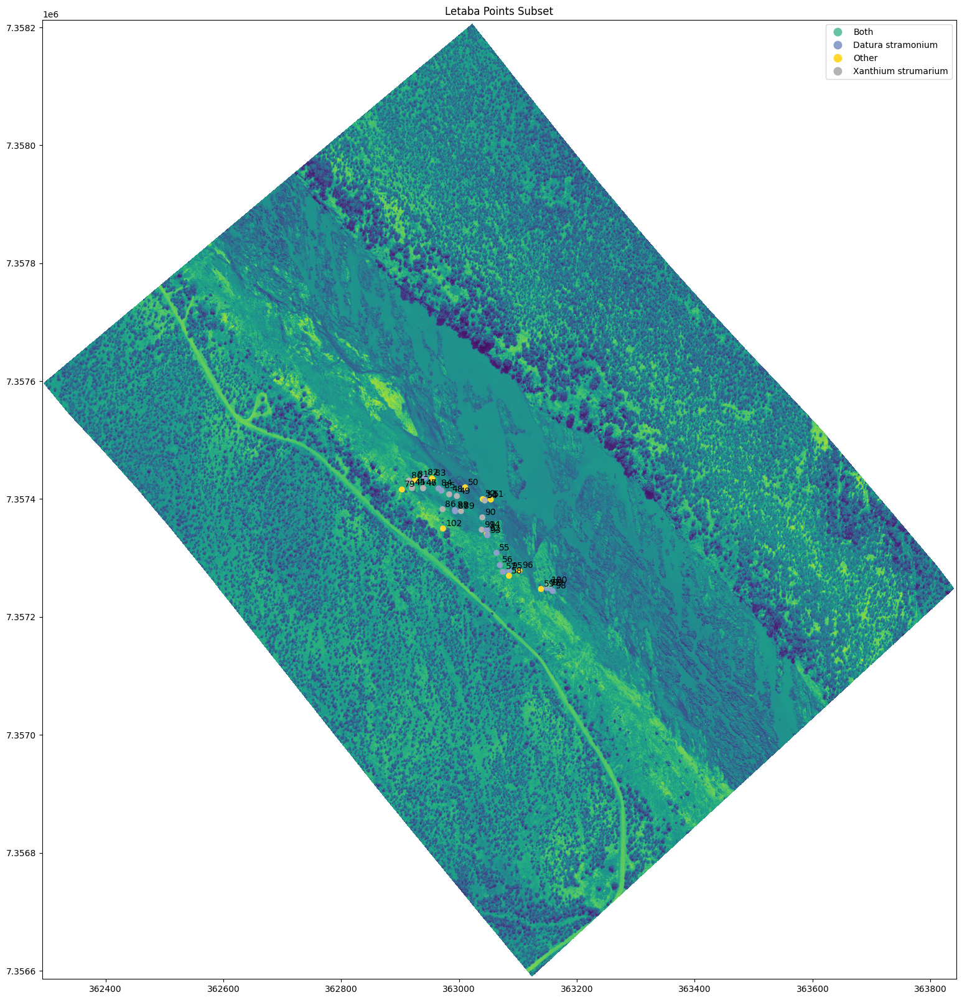

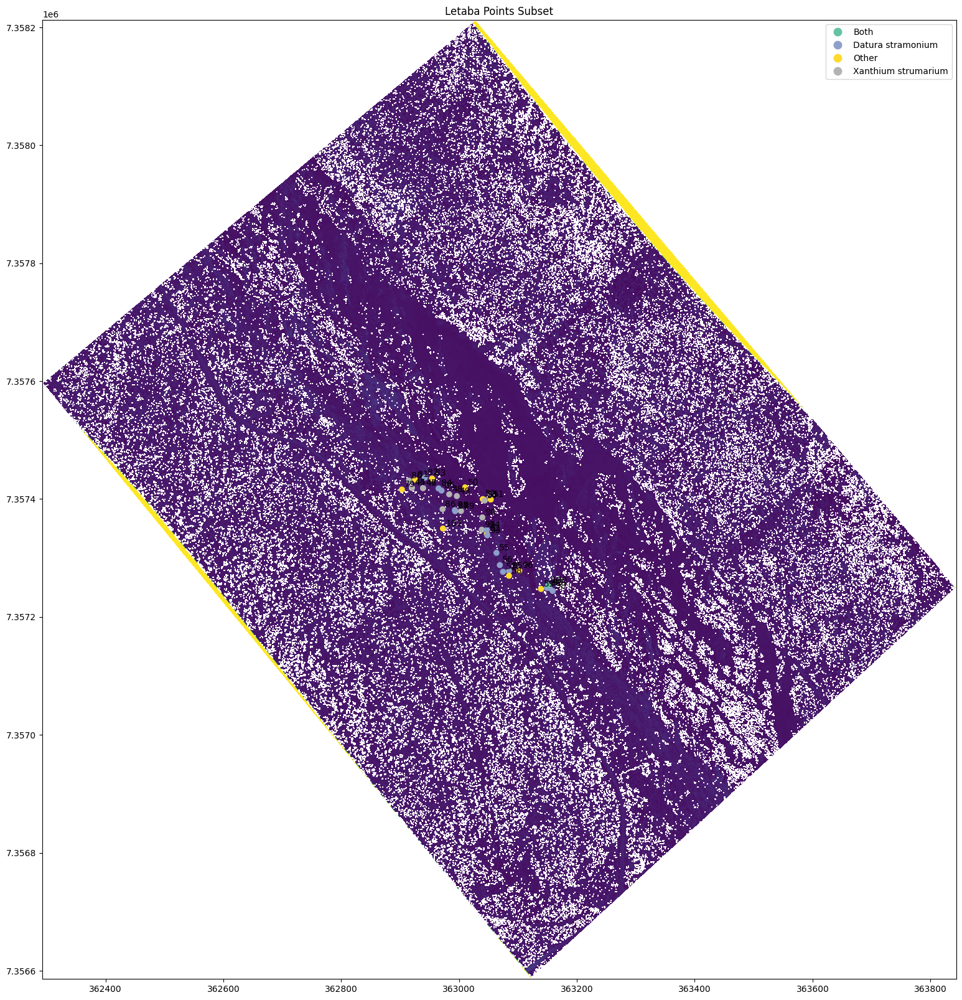

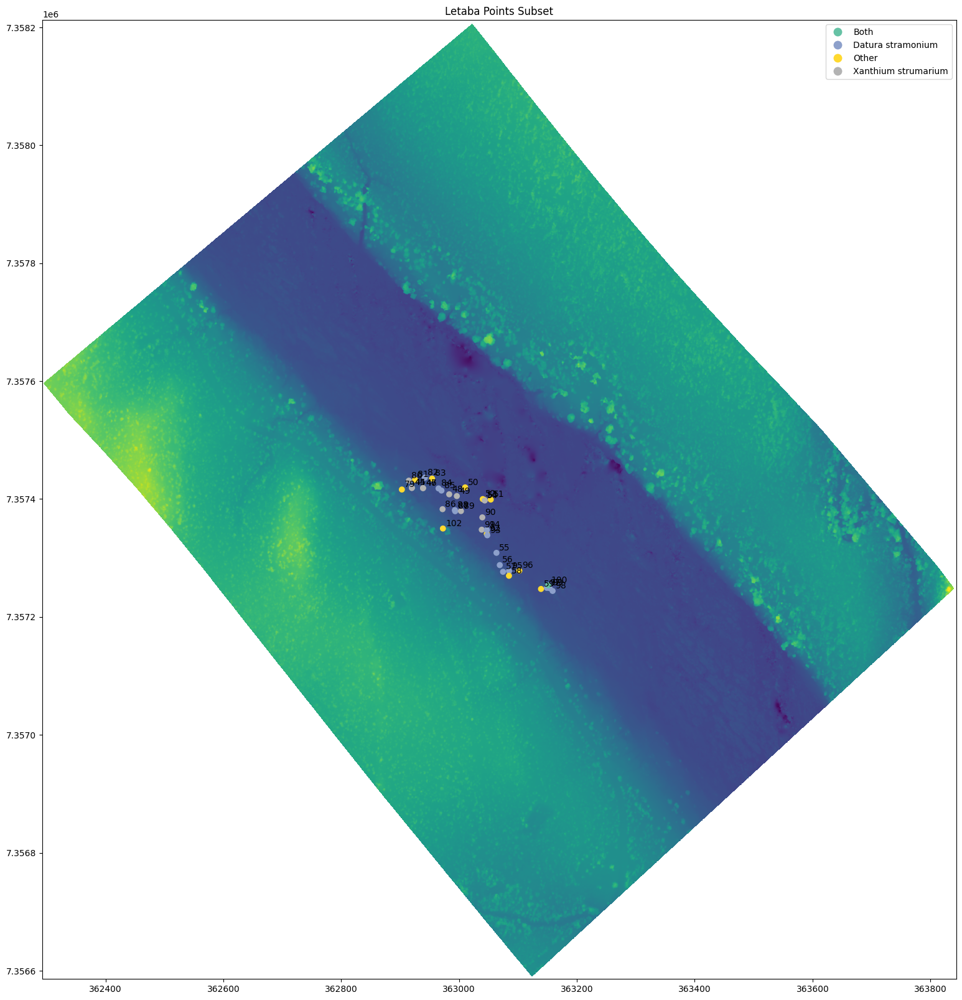

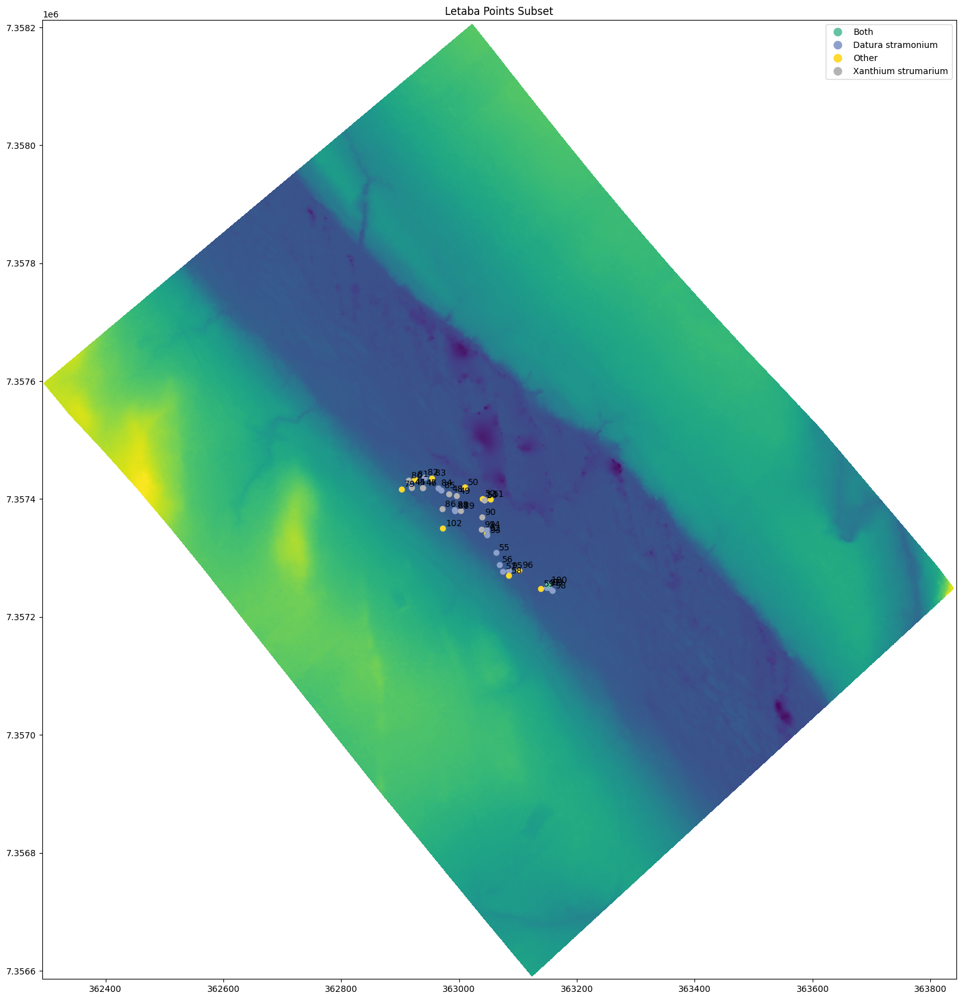

In [6]:
imgs, gdf = load_data(conf.data.path_raw_dml, conf.data.path_int_rs, 
                      conf.data.fn_ms, conf.data.fn_rgb, conf.data.fn_dsm, conf.data.fn_dtm, conf.data.fn_shp)
intersecting_box = get_bbox(imgs)
target_bounds = intersecting_box.bounds
rgb_clipped = clip_raster_to_bounds('rgb', conf.data.path_int_cl, imgs['rgb'], target_bounds)
ms_clipped = clip_raster_to_bounds('ms', conf.data.path_int_cl, imgs['ms'], target_bounds)
dsm_clipped = clip_raster_to_bounds('dsm', conf.data.path_int_cl, imgs['dsm'], target_bounds)
dtm_clipped = clip_raster_to_bounds('dtm', conf.data.path_int_cl, imgs['dtm'], target_bounds)
rgb_aligned = align_rasters('rgb', conf.data.path_int_al, rgb_clipped, dsm_clipped)
ms_aligned = align_rasters('ms', conf.data.path_int_al, ms_clipped, dsm_clipped)
clipped_gdf = clip_gdf(gdf, rgb_aligned.bounds)
clipped_gdf[['photoID', 'Species','geometry']].reset_index(drop=True).to_file(f"{conf.data.path_int}letaba_points.shp")
fig_rgb = plot_raster(clipped_gdf, rgb_aligned, show=False)
save_plot(fig_rgb, f"{conf.data.path_int}rgb.png")

fig_ms = plot_raster(clipped_gdf, ms_aligned, show=False)
save_plot(fig_ms, f"{conf.data.path_int}ms.png")

fig_dsm = plot_raster(clipped_gdf, dsm_clipped, show=False)
save_plot(fig_dsm, f"{conf.data.path_int}dsm.png")

fig_dtm = plot_raster(clipped_gdf, dtm_clipped, show=False)
save_plot(fig_dtm, f"{conf.data.path_int}dtm.png")

In [15]:
def process_shp(clipped_gdf, buffer=10):
    gdf_copy = clipped_gdf.copy()
    gdf_copy['buffer'] = gdf_copy.buffer(buffer)
    return gdf_copy


def crop_buffer(raster, polygon, path_pri, pid):
    geojson_polygon = mapping(polygon)
    out_image, out_transform = mask(raster, [geojson_polygon], crop=True)
    out_meta = raster.meta.copy()
    out_meta.update({"height": out_image.shape[1], "width": out_image.shape[2], "transform": out_transform})
    with rasterio.open(f"{path_pri}{pid}.tif", "w", **out_meta) as dst:
        dst.write(out_image)


def create_cropped_data(clipped_gdf, conf,
                     rgb_aligned, ms_aligned, dsm_clipped, dtm_clipped):
    gdf_copy = process_shp(clipped_gdf, buffer=conf.preprocess.crop_buffer)
    for _, row in gdf_copy.iterrows():
        crop_buffer(rgb_aligned, row.buffer, conf.data.path_pri_rgb, row.photoID)
        crop_buffer(ms_aligned, row.buffer, conf.data.path_pri_ms, row.photoID)
        crop_buffer(dsm_clipped, row.buffer, conf.data.path_pri_dsm, row.photoID)
        crop_buffer(dtm_clipped, row.buffer, conf.data.path_pri_dtm, row.photoID)
    return gdf_copy


def load_cropped_tifs(path):
    return glob.glob(f'{path}*.tif')


def plot_cropped_tifs(cropped_tifs, title):
    ncols = 3 # set number of columns (use 3 to demonstrate the change)
    nrows = len(cropped_tifs) // ncols + (len(cropped_tifs) % ncols > 0) # calculate number of rows

    plt.figure(figsize=(15, 20))
    plt.suptitle(title, fontsize=18, y=0.95)

    for n, file in enumerate(cropped_tifs):
        # add a new subplot iteratively using nrows and cols
        ax = plt.subplot(nrows, ncols, n + 1)
        # Plot raster crop
        saved_clipped_raster_io = rasterio.open(f"{file}")
        rasterio.plot.show(saved_clipped_raster_io, ax=ax)
        # chart formatting
        ax.set_title(os.path.basename(file), fontsize=8)
        ax.axis('off')
    plt.show()

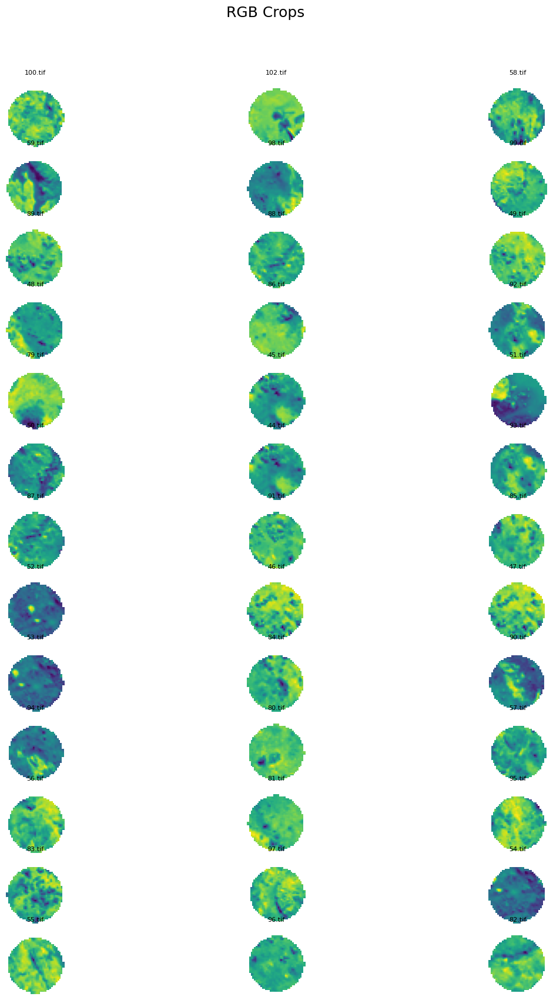

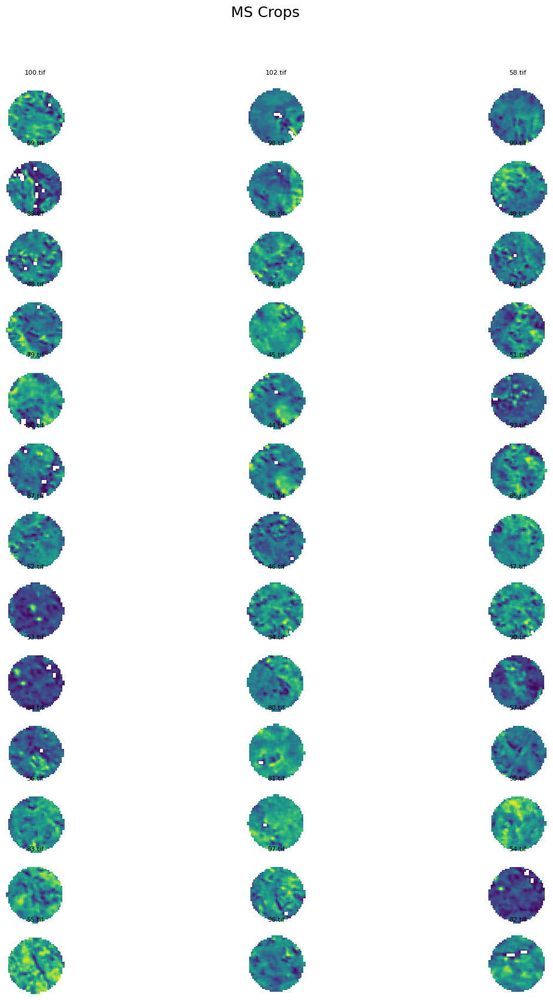

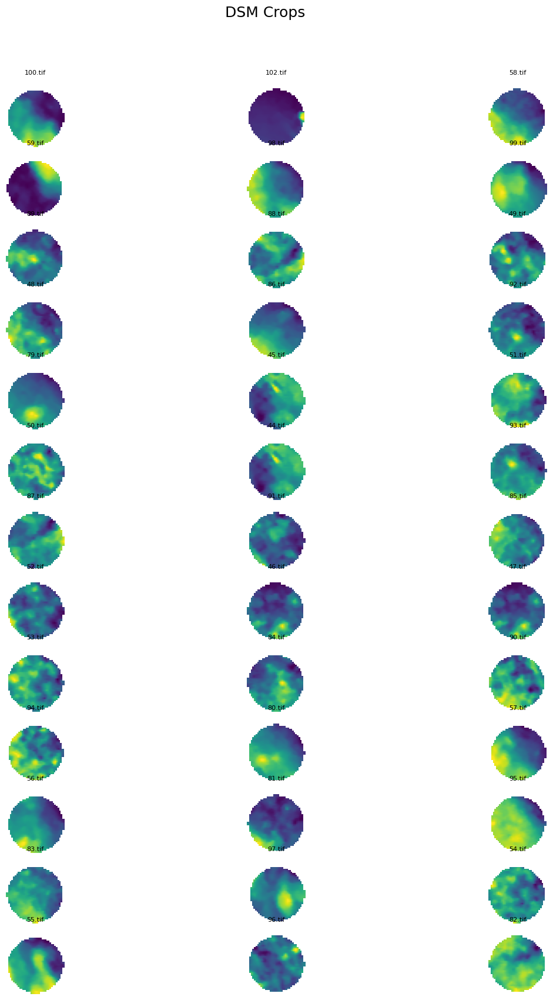

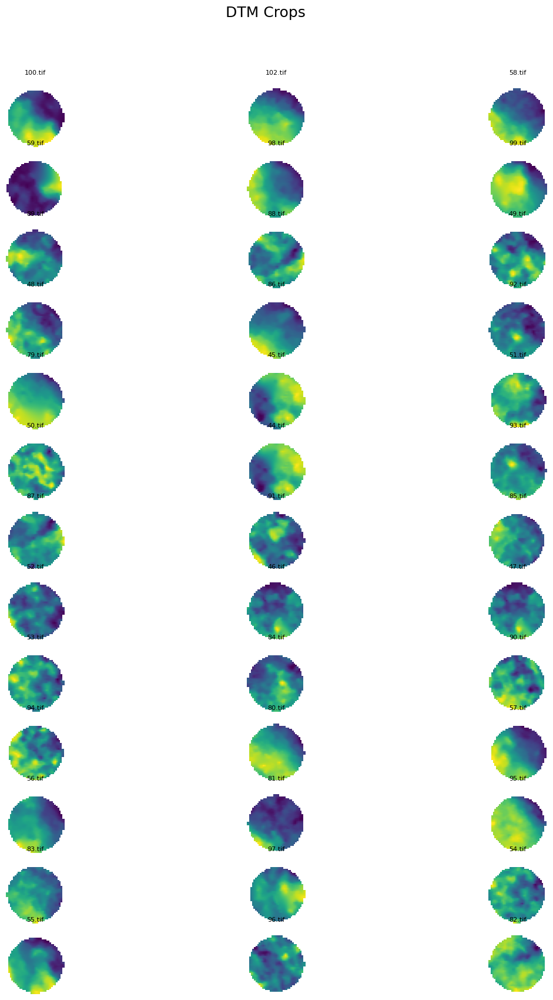

In [16]:
gdf_copy = create_cropped_data(clipped_gdf, conf,
                     rgb_aligned, ms_aligned, dsm_clipped, dtm_clipped)


cropped_tif_fns = load_cropped_tifs(conf.data.path_pri_rgb)
plot_cropped_tifs(cropped_tif_fns, "RGB Crops")

cropped_tif_fns = load_cropped_tifs(conf.data.path_pri_ms)
plot_cropped_tifs(cropped_tif_fns, "MS Crops")

cropped_tif_fns = load_cropped_tifs(conf.data.path_pri_dsm)
plot_cropped_tifs(cropped_tif_fns, "DSM Crops")

cropped_tif_fns = load_cropped_tifs(conf.data.path_pri_dtm)
plot_cropped_tifs(cropped_tif_fns, "DTM Crops")

In [9]:
# def crop_and_plot(raster, polygon):
#     geojson_polygon = mapping(polygon)
#     out_image, out_transform = mask(raster, [geojson_polygon], crop=True)
#     out_meta = raster.meta.copy()
#     out_meta.update({"height": out_image.shape[1], "width": out_image.shape[2], "transform": out_transform})

#     fig, ax = plt.subplots(figsize=(3, 3))
#     rasterio.plot.show(out_image, ax=ax)
#     plt.show()

In [10]:
# def plot_cropped_tifs(cropped_tifs, title):
#     ncols = 3 # set number of columns (use 3 to demonstrate the change)
#     nrows = len(cropped_tifs) // ncols + (len(cropped_tifs) % ncols > 0) # calculate number of rows

#     plt.figure(figsize=(15, 20))
#     plt.suptitle(title, fontsize=18, y=0.95)

#     for n, file in enumerate(cropped_tifs):
#         # add a new subplot iteratively using nrows and cols
#         ax = plt.subplot(nrows, ncols, n + 1)
#         # Plot raster crop
#         saved_clipped_raster_io = rasterio.open(f"{file}")
#         rasterio.plot.show(saved_clipped_raster_io, ax=ax)
#         # chart formatting
#         ax.set_title(os.path.basename(file), fontsize=8)
#         ax.axis('off')
#     plt.show()

In [11]:
# ncols = 3 # set number of columns (use 3 to demonstrate the change)
# nrows = len(files) // ncols + (len(files) % ncols > 0) # calculate number of rows

In [12]:
# _ = rasterio.open(f"../data/03_primary/rgb/79.tif")

In [13]:
# plt.figure(figsize=(15, 20))
# plt.suptitle("Cropped images", fontsize=18, y=0.95)

# for n, file in enumerate(files):
#     # add a new subplot iteratively using nrows and cols
#     ax = plt.subplot(nrows, ncols, n + 1)
#     # Plot raster crop
#     saved_clipped_raster_io = rasterio.open(f"{file}")
#     rasterio.plot.show(saved_clipped_raster_io, ax=ax)
#     # chart formatting
#     ax.set_title(os.path.basename(file), fontsize=8)
#     ax.axis('off')
# plt.show()
